In [1]:
import warnings
warnings.simplefilter('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pd.options.display.max_rows = 300
%matplotlib inline

# Load Data

In [2]:
train = pd.read_csv('./data/train.csv')
test = pd.read_csv('./data/test.csv')
print('Train:\t', train.shape)
print('Test: \t', test.shape)

Train:	 (307511, 320)
Test: 	 (48744, 319)


Target 1:	 0.0807
Target 0:	 0.9193


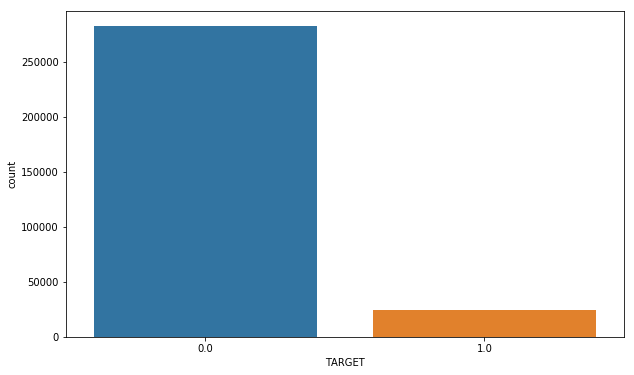

In [3]:
print('Target 1:\t', np.round(train['TARGET'].sum()/len(train), 4))
print('Target 0:\t', np.round(1 - train['TARGET'].sum()/len(train), 4))
fig, ax = plt.subplots(figsize=(10, 6))
sns.countplot(train['TARGET'], ax=ax)
plt.show()

# Simple Cleaning

In [4]:
# get missing information (missing rate > 0)
train_null = train.isnull().sum() / len(train)
train_null = train_null[train_null > 0]
train_null = train_null.reset_index()
train_null = train_null.rename(columns={'index': 'feature', 0: 'train miss'})

test_null = test.isnull().sum() / len(test)
test_null = test_null[test_null > 0]
test_null = test_null.reset_index()
test_null = test_null.rename(columns={'index': 'feature', 0: 'test miss'})

# merge train and test null information
data_null = pd.merge(left=train_null, right=test_null, how='outer')
data_null = data_null.fillna(value=0)
data_null = data_null.sort_values(by='train miss', ascending=False)

feature_list = data_null['feature']
null_rate = []
not_null_rate = []
category = []
train_unique = []
test_unique = []
for feature in feature_list:
    null_rate.append(train[train[feature].isnull()]['TARGET'].mean())
    not_null_rate.append(train[~train[feature].isnull()]['TARGET'].mean())
    category.append(train[feature].dtype)
    train_unique.append(len(train[feature].unique()))
    test_unique.append(len(test[feature].unique()))

data_null['dtype'] = category    
data_null['null mean'] = null_rate
data_null['not null mean'] = not_null_rate
data_null['train unique'] = train_unique
data_null['test unique'] = test_unique

data_null = data_null.reset_index(drop=True)

data_null[['feature', 'train miss', 'test miss', 'dtype', 'null mean', 
           'not null mean', 'train unique', 'test unique']]

,feature,train miss,test miss,dtype,null mean,not null mean,train unique,test unique
0,Median_Credit_AMT_PAYMENT_CURRENT,0.801438,0.773100,float64,0.075966,0.099951,22680,5248
1,Mean_Credit_AMT_PAYMENT_CURRENT,0.801438,0.773100,float64,0.075966,0.099951,56774,10629
2,Median_Credit_AMT_DRAWINGS_POS_CURRENT,0.801178,0.773223,float64,0.075837,0.100442,12053,2428
3,Median_Credit_CNT_DRAWINGS_POS_CURRENT,0.801178,0.773223,float64,0.075837,0.100442,120,86
4,Mean_Credit_CNT_DRAWINGS_ATM_CURRENT,0.801178,0.773223,float64,0.075837,0.100442,3386,1684
5,Median_Credit_CNT_DRAWINGS_ATM_CURRENT,0.801178,0.773223,float64,0.075837,0.100442,38,18
6,Mean_Credit_AMT_DRAWINGS_ATM_CURRENT,0.801178,0.773223,float64,0.075837,0.100442,22421,5496
7,Median_Credit_AMT_DRAWINGS_ATM_CURRENT,0.801178,0.773223,float64,0.075837,0.100442,442,185
8,Mean_Credit_CNT_DRAWINGS_OTHER_CURRENT,0.801178,0.773223,float64,0.075837,0.100442,450,187
9,Mean_Credit_AMT_DRAWINGS_OTHER_CURRENT,0.801178,0.773223,float64,0.075837,0.100442,3924,723


In [5]:
# drop useless columns (features with training missing rate > 0.1)
drop_columns = ['Median_Credit_AMT_PAYMENT_CURRENT', 'Mean_Credit_AMT_PAYMENT_CURRENT',
       'Median_Credit_AMT_DRAWINGS_POS_CURRENT', 'Median_Credit_CNT_DRAWINGS_POS_CURRENT',
       'Mean_Credit_CNT_DRAWINGS_ATM_CURRENT', 'Median_Credit_CNT_DRAWINGS_ATM_CURRENT',
       'Mean_Credit_AMT_DRAWINGS_ATM_CURRENT', 'Median_Credit_AMT_DRAWINGS_ATM_CURRENT',
       'Mean_Credit_CNT_DRAWINGS_OTHER_CURRENT', 'Mean_Credit_AMT_DRAWINGS_OTHER_CURRENT',
       'Median_Credit_AMT_DRAWINGS_OTHER_CURRENT', 'Median_Credit_CNT_DRAWINGS_OTHER_CURRENT',
       'Mean_Credit_AMT_DRAWINGS_POS_CURRENT', 'Mean_Credit_CNT_DRAWINGS_POS_CURRENT',
       'Mean_AMT_CREDIT_MAX_OVERDUE', 'Median_AMT_CREDIT_MAX_OVERDUE', 'Mean_AMT_ANNUITY', 
       'Median_AMT_ANNUITY', 'Sum_Credit_CNT_INSTALMENT_MATURE_CUM', 'Sum_Credit_CNT_DRAWINGS_POS_CURRENT', 
       'Sum_Credit_MONTH_BALANCE', 'Sum_Credit_CNT_DRAWINGS_ATM_CURRENT', 
       'Sum_Credit_CNT_DRAWINGS_CURRENT', 'Sum_Credit_SK_DPD', 'Mean_Credit_CNT_DRAWINGS_CURRENT',
       'Median_Credit_CNT_DRAWINGS_CURRENT', 'Sum_Credit_CNT_DRAWINGS_OTHER_CURRENT', 
       'Median_Credit_CNT_INSTALMENT_MATURE_CUM', 'Mean_Credit_CNT_INSTALMENT_MATURE_CUM',
       'Median_Credit_MONTH_BALANCE', 'Mean_Credit_MONTH_BALANCE', 'Sum_Credit_AMT_BALANCE', 
       'Median_Credit_AMT_TOTAL_RECEIVABLE', 'Mean_Credit_AMT_BALANCE', 'Median_Credit_AMT_RECIVABLE',
       'Mean_Credit_AMT_RECIVABLE', 'Sum_Credit_AMT_RECIVABLE', 'Median_Credit_AMT_RECEIVABLE_PRINCIPAL',
       'Mean_Credit_AMT_RECEIVABLE_PRINCIPAL', 'Sum_Credit_AMT_RECEIVABLE_PRINCIPAL',
       'Median_Credit_AMT_PAYMENT_TOTAL_CURRENT', 'Mean_Credit_AMT_PAYMENT_TOTAL_CURRENT',
       'Sum_Credit_AMT_PAYMENT_TOTAL_CURRENT', 'Sum_Credit_AMT_PAYMENT_CURRENT',
       'Median_Credit_AMT_INST_MIN_REGULARITY', 'Mean_Credit_AMT_INST_MIN_REGULARITY',
       'Sum_Credit_AMT_INST_MIN_REGULARITY', 'Sum_Credit_AMT_DRAWINGS_POS_CURRENT',
       'Sum_Credit_AMT_DRAWINGS_OTHER_CURRENT', 'Median_Credit_AMT_DRAWINGS_CURRENT',
       'Mean_Credit_AMT_DRAWINGS_CURRENT', 'Sum_Credit_AMT_DRAWINGS_CURRENT',
       'Sum_Credit_AMT_DRAWINGS_ATM_CURRENT', 'Median_Credit_AMT_CREDIT_LIMIT_ACTUAL',
       'Mean_Credit_AMT_CREDIT_LIMIT_ACTUAL', 'Mean_Credit_AMT_TOTAL_RECEIVABLE', 
       'Median_Credit_AMT_BALANCE', 'Sum_Credit_AMT_CREDIT_LIMIT_ACTUAL',
       'Sum_Credit_AMT_TOTAL_RECEIVABLE', 'Mean_Credit_SK_DPD_DEF', 'Sum_Credit_SK_DPD_DEF', 
       'Median_Credit_SK_DPD', 'Median_Credit_SK_DPD_DEF', 'Mean_Credit_SK_DPD',
       'Median_MONTHS_COUNT', 'Mean_MONTHS_COUNT', 'COMMONAREA_MEDI', 'COMMONAREA_MODE', 
       'COMMONAREA_AVG', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_MEDI', 
       'NONLIVINGAPARTMENTS_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAPARTMENTS_MEDI', 
       'LIVINGAPARTMENTS_MODE', 'FLOORSMIN_MEDI', 'FLOORSMIN_AVG', 'FLOORSMIN_MODE', 
       'YEARS_BUILD_MODE', 'YEARS_BUILD_AVG', 'YEARS_BUILD_MEDI', 'OWN_CAR_AGE', 'LANDAREA_MEDI', 
       'LANDAREA_AVG', 'LANDAREA_MODE', 'BASEMENTAREA_AVG', 'BASEMENTAREA_MEDI', 'BASEMENTAREA_MODE', 
       'EXT_SOURCE_1', 'NONLIVINGAREA_MEDI', 'NONLIVINGAREA_MODE', 'NONLIVINGAREA_AVG', 'ELEVATORS_MEDI', 
       'ELEVATORS_MODE', 'ELEVATORS_AVG', 'APARTMENTS_AVG', 'APARTMENTS_MODE', 'APARTMENTS_MEDI', 
       'ENTRANCES_MODE', 'ENTRANCES_MEDI', 'ENTRANCES_AVG', 'LIVINGAREA_MODE', 'LIVINGAREA_MEDI', 
       'LIVINGAREA_AVG', 'FLOORSMAX_MODE', 'FLOORSMAX_AVG', 'FLOORSMAX_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI', 
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'TOTALAREA_MODE',
       'Mean_DAYS_ENDDATE_FACT', 'Median_DAYS_ENDDATE_FACT', 'Mean_AMT_CREDIT_SUM_LIMIT', 
       'Median_AMT_CREDIT_SUM_LIMIT', 'Mean_AMT_CREDIT_SUM_DEBT', 'Median_AMT_CREDIT_SUM_DEBT',
       'Median_DAYS_CREDIT_ENDDATE', 'Mean_DAYS_CREDIT_ENDDATE', 'Mean_AMT_CREDIT_SUM', 
       'Median_AMT_CREDIT_SUM', 'Sum_AMT_CREDIT_MAX_OVERDUE', 'Sum_DAYS_ENDDATE_FACT',
       'Sum_DAYS_CREDIT', 'Mean_DAYS_CREDIT', 'Median_DAYS_CREDIT', 'Sum_DAYS_CREDIT_ENDDATE', 
       'Sum_MONTHS_COUNT', 'Sum_CNT_CREDIT_PROLONG', 'Mean_CNT_CREDIT_PROLONG', 'Median_CNT_CREDIT_PROLONG', 
       'Sum_AMT_CREDIT_SUM', 'Sum_AMT_CREDIT_SUM_DEBT', 'Sum_AMT_CREDIT_SUM_LIMIT',
       'Sum_AMT_CREDIT_SUM_OVERDUE', 'Mean_AMT_CREDIT_SUM_OVERDUE', 'Median_AMT_CREDIT_SUM_OVERDUE', 
       'Sum_AMT_ANNUITY', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_HOUR', 
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'Median_prev_RATE_DOWN_PAYMENT', 'Mean_prev_RATE_DOWN_PAYMENT', 
       'Median_prev_AMT_DOWN_PAYMENT', 'Mean_prev_AMT_DOWN_PAYMENT']

In [6]:
train = train.drop(labels=drop_columns, axis=1)
test = test.drop(labels=drop_columns, axis=1)
print('Train:\t', train.shape)
print('Test: \t', test.shape)

Train:	 (307511, 172)
Test: 	 (48744, 171)


In [7]:
# define categorical features
cat_feature = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 
               'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 
               'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 
               'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 
               'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 
               'Binary_CREDIT_DAY_OVERDUE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 
               'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 
               'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',  
               'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 
               'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'FLAG_DOCUMENT_2', 
               'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 
               'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 
               'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 
               'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 
               'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 
               'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19',  'FLAG_DOCUMENT_20', 
               'FLAG_DOCUMENT_21', ]

dis_feature = ['CNT_CHILDREN', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 
               'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 
               'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 
               'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 
               'Total_BUREAU', 'Closed_BUREAU', 'Active_BUREAU', 'Sold_BUREAU', 
               'Bad_BUREAU', 'Count_AMT_CREDIT_MAX_OVERDUE', 'Credit_CREDIT_TYPE', 
               'Loan_CREDIT_TYPE', 'Count_POS_CASH', 'Completed_CASH_CONTRACT', 
               'Other_CASH_CONTRACT', 'Count_Credit_Card', 'Active_Credit_CONTRACT', 
               'Completed_Credit_CONTRACT', 'Other_Credit_CONTRACT', 'Count_installment', 
               'Count_prev', 'Count_prev_Cash_loan', 'Count_prev_Consumer_loan', 
               'Count_prev_Revolving_loan', 'Count_Y_prev_FLAG_LAST_APPL_PER_CONTRACT', 
               'Count_N_prev_FLAG_LAST_APPL_PER_CONTRACT', 'Count_1_prev_NFLAG_LAST_APPL_IN_DAY', 
               'Count_0_prev_NFLAG_LAST_APPL_IN_DAY', 'Count_Approved_prev_NAME_CONTRACT_STATUS', 
               'Count_Canceled_prev_NAME_CONTRACT_STATUS', 'Count_Refused_prev_NAME_CONTRACT_STATUS', 
               'Count_Unused_prev_NAME_CONTRACT_STATUS',  'Count_Cash_prev_NAME_PAYMENT_TYPE',
               'Count_XNA_prev_NAME_PAYMENT_TYPE', 'Count_Noncash_prev_NAME_PAYMENT_TYPE', 
               'Count_Unaccompanied_prev_NAME_TYPE_SUITE', 'Count_Accompanied_prev_NAME_TYPE_SUITE', 
               'Count_Other_NAME_TYPE_SUITE', 'Count_Repeater_prev_NAME_CLIENT_TYPE', 
               'Count_New_prev_NAME_CLIENT_TYPE', 'Count_Refreshed_prev_NAME_CLIENT_TYPE', 
               'Count_POS_prev_NAME_PORTFOLIO', 'Count_Cash_prev_NAME_PORTFOLIO', 
               'Count_Cards_prev_NAME_PORTFOLIO', 'Count_Other_prev_NAME_PORTFOLIO', 
               'Count_XNA_prev_NAME_PRODUCT_TYPE', 'Count_xsell_prev_NAME_PRODUCT_TYPE', 
               'Count_walkin_prev_NAME_PRODUCT_TYPE', 'Count_0_prev_NFLAG_INSURED_ON_APPROVAL', 
               'Count_1_prev_NFLAG_INSURED_ON_APPROVAL']

con_feature = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 
               'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 
               'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'EXT_SOURCE_2', 
               'EXT_SOURCE_3', 'DAYS_LAST_PHONE_CHANGE', 'Sum_CASH_MONTH_BALANCE', 
               'Mean_CASH_MONTH_BALANCE', 'Median_CASH_MONTH_BALANCE', 'Sum_CASH_CNT_INSTALMENT', 
               'Mean_CASH_CNT_INSTALMENT', 'Median_CASH_CNT_INSTALMENT', 
               'Sum_CASH_CNT_INSTALMENT_FUTURE', 'Mean_CASH_CNT_INSTALMENT_FUTURE', 
               'Median_CASH_CNT_INSTALMENT_FUTURE', 'Active_CASH_CONTRACT', 
               'Sum_CASH_SK_DPD', 'Mean_CASH_SK_DPD', 'Median_CASH_SK_DPD', 'Sum_CASH_SK_DPD_DEF', 
               'Mean_CASH_SK_DPD_DEF', 'Median_CASH_SK_DPD_DEF', 'Sum_NUM_INSTALMENT_VERSION', 
               'Mean_NUM_INSTALMENT_VERSION', 'Median_NUM_INSTALMENT_VERSION', 
               'Sum_NUM_INSTALMENT_NUMBER', 'Mean_NUM_INSTALMENT_NUMBER', 
               'Median_NUM_INSTALMENT_NUMBER', 'Sum_DAYS_INSTALMENT', 'Mean_DAYS_INSTALMENT',
               'Median_DAYS_INSTALMENT', 'Sum_DAYS_ENTRY_PAYMENT', 'Mean_DAYS_ENTRY_PAYMENT', 
               'Median_DAYS_ENTRY_PAYMENT', 'Sum_AMT_INSTALMENT', 'Mean_AMT_INSTALMENT', 
               'Median_AMT_INSTALMENT', 'Sum_AMT_PAYMENT', 'Mean_AMT_PAYMENT', 'Median_AMT_PAYMENT',
               'Sum_prev_AMT_ANNUITY', 'Mean_prev_AMT_ANNUITY', 'Median_prev_AMT_ANNUITY', 
               'Sum_prev_AMT_APPLICATION', 'Mean_prev_AMT_APPLICATION', 'Median_prev_AMT_APPLICATION', 
               'Sum_prev_AMT_CREDIT', 'Mean_prev_AMT_CREDIT', 'Median_prev_AMT_CREDIT', 
               'Sum_prev_AMT_DOWN_PAYMENT', 'Sum_prev_AMT_GOODS_PRICE',  'Mean_prev_AMT_GOODS_PRICE', 
               'Median_prev_AMT_GOODS_PRICE', 'Sum_prev_RATE_DOWN_PAYMENT', 'Sum_prev_DAYS_DECISION', 
               'Mean_prev_DAYS_DECISION', 'Median_prev_DAYS_DECISION','Sum_prev_CNT_PAYMENT', 
               'Mean_prev_CNT_PAYMENT', 'Median_prev_CNT_PAYMENT']

In [8]:
# define numerical and categorical features
print('Categorical:\t', len(cat_feature))
print('Discrete:\t', len(dis_feature))
print('Continuous:\t', len(con_feature))

Categorical:	 49
Discrete:	 55
Continuous:	 66


In [9]:
# # define numerical features
# num_names = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
# numerical = list(train.select_dtypes(include=num_names).columns)
# numerical.remove('TARGET')
# numerical.remove('SK_ID_CURR')
# categorical = list(train.select_dtypes(exclude=num_names).columns)

# print('Total numerical features:\t', len(numerical))
# print('Total categorical features:\t', len(categorical))

# Categorical Features

In [10]:
# get missing information (missing rate > 0)
train_null = train[cat_feature].isnull().sum() / len(train)
train_null = train_null[train_null > 0]
train_null = train_null.reset_index()
train_null = train_null.rename(columns={'index': 'feature', 0: 'train miss'})

test_null = test[cat_feature].isnull().sum() / len(test)
test_null = test_null[test_null > 0]
test_null = test_null.reset_index()
test_null = test_null.rename(columns={'index': 'feature', 0: 'test miss'})

# merge train and test null information
data_null = pd.merge(left=train_null, right=test_null, how='outer')
data_null = data_null.fillna(value=0)
data_null = data_null.sort_values(by='train miss', ascending=False)

feature_list = data_null['feature']
null_rate = []
not_null_rate = []
category = []
train_unique = []
test_unique = []
for feature in feature_list:
    null_rate.append(train[train[feature].isnull()]['TARGET'].mean())
    not_null_rate.append(train[~train[feature].isnull()]['TARGET'].mean())
    category.append(train[feature].dtype)
    train_unique.append(len(train[feature].unique()))
    test_unique.append(len(test[feature].unique()))

data_null['dtype'] = category    
data_null['null mean'] = null_rate
data_null['not null mean'] = not_null_rate
data_null['train unique'] = train_unique
data_null['test unique'] = test_unique

data_null = data_null.reset_index(drop=True)

data_null[['feature', 'train miss', 'test miss', 'dtype', 'null mean', 
           'not null mean', 'train unique', 'test unique']]

,feature,train miss,test miss,dtype,null mean,not null mean,train unique,test unique
0,FONDKAPREMONT_MODE,0.683862,0.672842,object,0.086188,0.068919,5,5
1,WALLSMATERIAL_MODE,0.508408,0.490173,object,0.091281,0.069815,8,8
2,HOUSETYPE_MODE,0.501761,0.484552,object,0.091512,0.069870,4,4
3,EMERGENCYSTATE_MODE,0.473983,0.455625,object,0.092607,0.070025,3,3
4,OCCUPATION_TYPE,0.313455,0.320142,object,0.065131,0.087851,19,19
5,Binary_CREDIT_DAY_OVERDUE,0.143149,0.131791,object,0.101249,0.077301,3,3
6,NAME_TYPE_SUITE,0.004201,0.018689,object,0.054180,0.080841,8,8


In [11]:
# feature engineering
cat_missing = ['FONDKAPREMONT_MODE', 'WALLSMATERIAL_MODE', 'HOUSETYPE_MODE', 'NAME_TYPE_SUITE', 
               'EMERGENCYSTATE_MODE', 'OCCUPATION_TYPE', 'Binary_CREDIT_DAY_OVERDUE']

# fill missing vcat_missingth 'NA'
for feature in cat_missing:
    train[feature] = train[feature].fillna(value='NA')
    test[feature] = test[feature].fillna(value='NA')
    
# remove useless records from training set
train = train[train['CODE_GENDER'] != 'XNA']
tran = train[train['NAME_FAMILY_STATUS'] != 'Unknown']

# double check the missing values
print(train[cat_feature].isnull().sum().sum(), test[cat_feature].isnull().sum().sum())

0 0


In [12]:
# helper function for visualization
def plot_categorical(data, feature, figsize=(16, 5)):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=figsize)
    tmp = data.groupby('TARGET')[feature].apply(lambda x: x.value_counts(normalize=True))
    tmp = tmp.unstack()
    tmp.plot(kind='bar', ax=ax[0])

    sns.barplot(x=feature, y='TARGET', data=data, ax=ax[1])
    ax[1].set_xlabel(feature, fontsize=12)
    ax[1].set_ylabel('Default Rate', fontsize=12)
    plt.tight_layout()
    return fig, ax

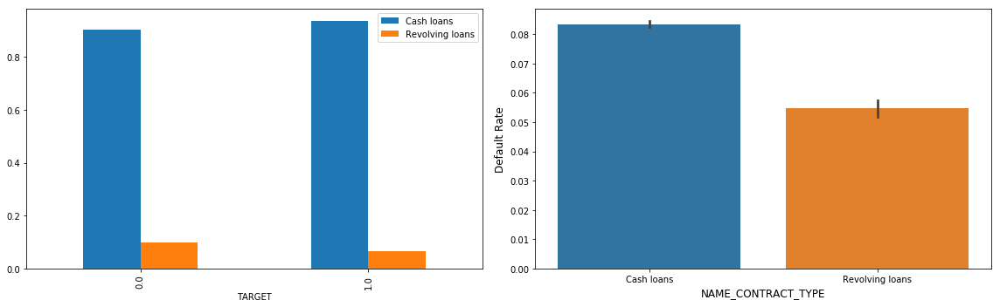

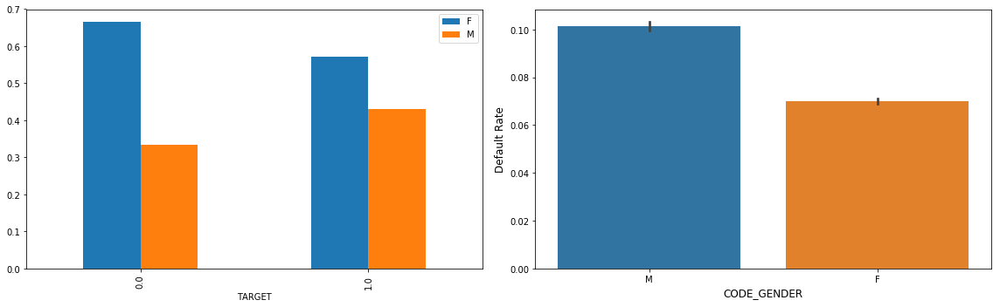

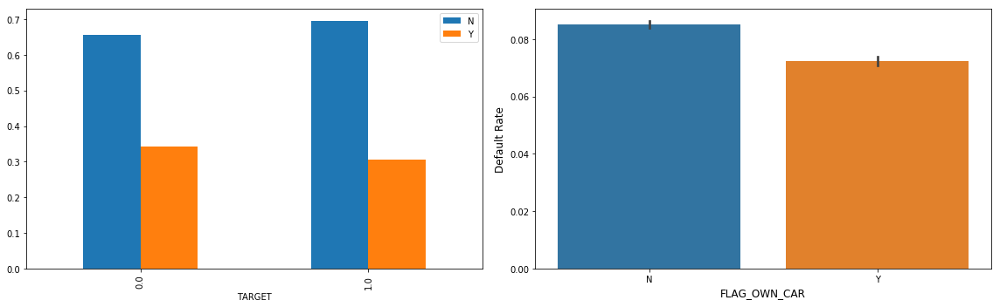

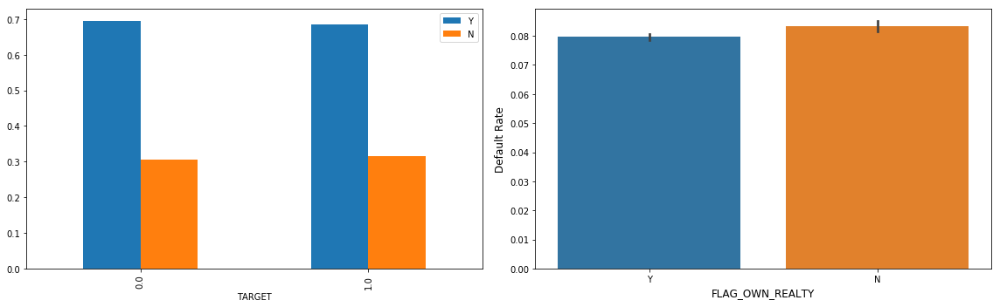

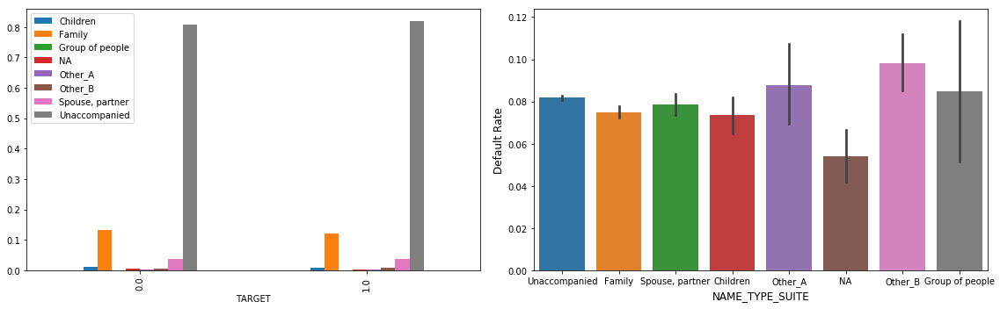

...

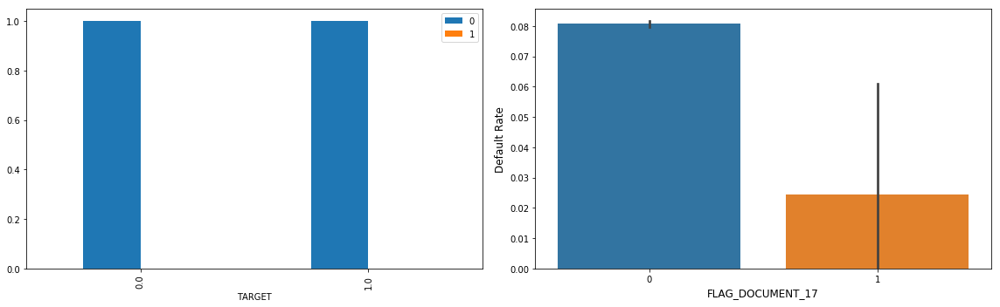

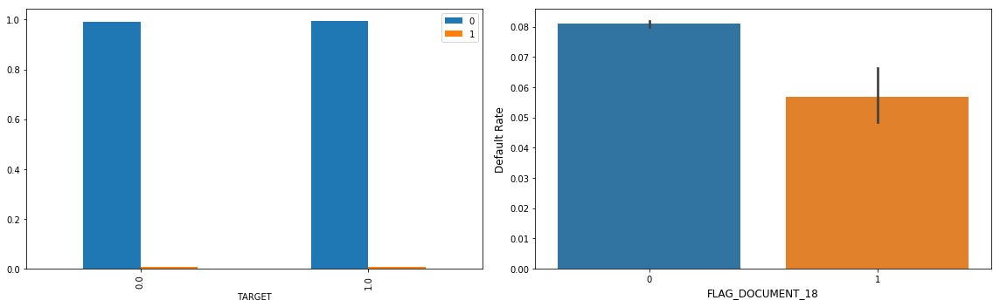

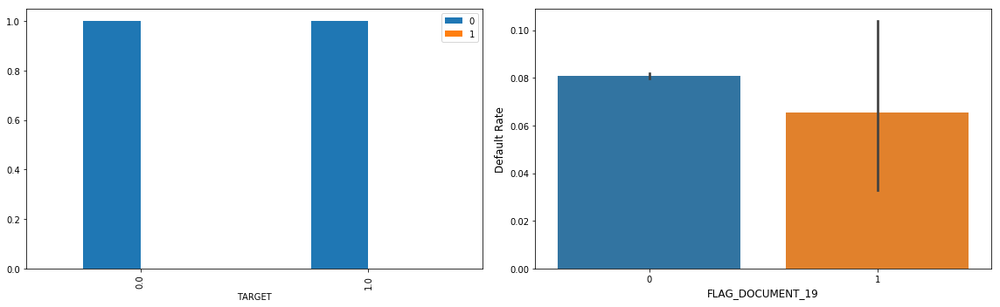

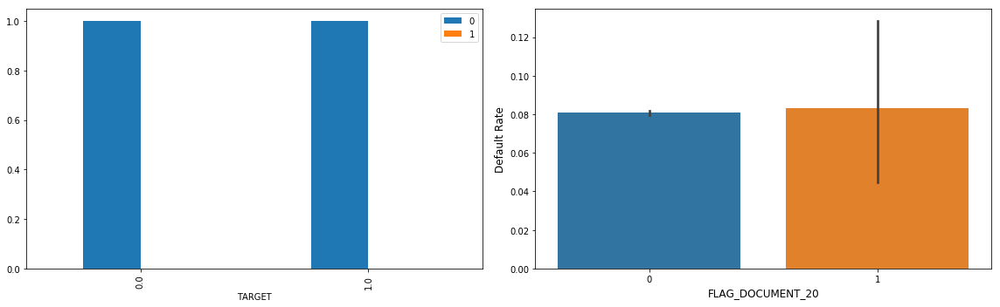

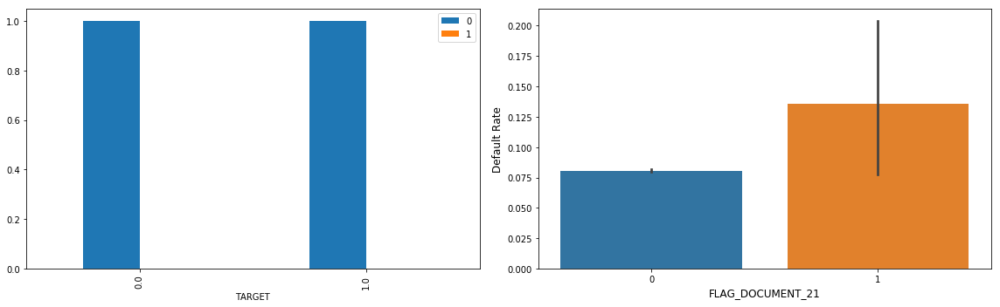

In [13]:
# visualize the categorical features
for feature in cat_feature:
    fig, ax = plot_categorical(train, feature=feature, figsize=(16, 5))
    plt.show()

# Discrete Features

In [14]:
# get missing information (missing rate > 0)
train_null = train[dis_feature].isnull().sum() / len(train)
train_null = train_null[train_null > 0]
train_null = train_null.reset_index()
train_null = train_null.rename(columns={'index': 'feature', 0: 'train miss'})

test_null = test[dis_feature].isnull().sum() / len(test)
test_null = test_null[test_null > 0]
test_null = test_null.reset_index()
test_null = test_null.rename(columns={'index': 'feature', 0: 'test miss'})

# merge train and test null information
data_null = pd.merge(left=train_null, right=test_null, how='outer')
data_null = data_null.fillna(value=0)
data_null = data_null.sort_values(by='train miss', ascending=False)

feature_list = data_null['feature']
null_rate = []
not_null_rate = []
category = []
train_unique = []
test_unique = []
for feature in feature_list:
    null_rate.append(train[train[feature].isnull()]['TARGET'].mean())
    not_null_rate.append(train[~train[feature].isnull()]['TARGET'].mean())
    category.append(train[feature].dtype)
    train_unique.append(len(train[feature].unique()))
    test_unique.append(len(test[feature].unique()))

data_null['dtype'] = category    
data_null['null mean'] = null_rate
data_null['not null mean'] = not_null_rate
data_null['train unique'] = train_unique
data_null['test unique'] = test_unique

data_null = data_null.reset_index(drop=True)

data_null[['feature', 'train miss', 'test miss', 'dtype', 'null mean', 
           'not null mean', 'train unique', 'test unique']]

,feature,train miss,test miss,dtype,null mean,not null mean,train unique,test unique
0,Count_Credit_Card,0.717389,0.658358,float64,0.078381,0.086692,5,4
1,Other_Credit_CONTRACT,0.717389,0.658358,float64,0.078381,0.086692,55,25
2,Completed_Credit_CONTRACT,0.717389,0.658358,float64,0.078381,0.086692,41,41
3,Active_Credit_CONTRACT,0.717389,0.658358,float64,0.078381,0.086692,104,100
4,Sold_BUREAU,0.143151,0.131791,float64,0.101249,0.077302,9,7
5,Loan_CREDIT_TYPE,0.143151,0.131791,float64,0.101249,0.077302,32,33
6,Count_AMT_CREDIT_MAX_OVERDUE,0.143151,0.131791,float64,0.101249,0.077302,14,11
7,Bad_BUREAU,0.143151,0.131791,float64,0.101249,0.077302,3,3
8,Credit_CREDIT_TYPE,0.143151,0.131791,float64,0.101249,0.077302,59,49
9,Active_BUREAU,0.143151,0.131791,float64,0.101249,0.077302,24,20


In [15]:
# feature engineering
dis_missing = ['Count_Credit_Card', 'Other_Credit_CONTRACT', 'Completed_Credit_CONTRACT', 
               'Active_Credit_CONTRACT', 'Sold_BUREAU', 'Loan_CREDIT_TYPE', 
               'Count_AMT_CREDIT_MAX_OVERDUE', 'Bad_BUREAU', 'Credit_CREDIT_TYPE', 
               'Active_BUREAU', 'Closed_BUREAU', 'Total_BUREAU', 'Count_POS_CASH',
               'Completed_CASH_CONTRACT', 'Other_CASH_CONTRACT', 
               'Count_POS_prev_NAME_PORTFOLIO', 'Count_Other_NAME_TYPE_SUITE',
               'Count_Accompanied_prev_NAME_TYPE_SUITE', 'Count_Unaccompanied_prev_NAME_TYPE_SUITE',
               'Count_Noncash_prev_NAME_PAYMENT_TYPE', 'Count_Repeater_prev_NAME_CLIENT_TYPE',
               'Count_New_prev_NAME_CLIENT_TYPE', 'Count_Refreshed_prev_NAME_CLIENT_TYPE',
               'Count_Y_prev_FLAG_LAST_APPL_PER_CONTRACT', 'Count_Cash_prev_NAME_PORTFOLIO',
               'Count_Cards_prev_NAME_PORTFOLIO', 'Count_Other_prev_NAME_PORTFOLIO',
               'Count_XNA_prev_NAME_PRODUCT_TYPE', 'Count_Cash_prev_NAME_PAYMENT_TYPE',
               'Count_xsell_prev_NAME_PRODUCT_TYPE', 'Count_walkin_prev_NAME_PRODUCT_TYPE',
               'Count_0_prev_NFLAG_INSURED_ON_APPROVAL', 'Count_XNA_prev_NAME_PAYMENT_TYPE',
               'Count_1_prev_NFLAG_INSURED_ON_APPROVAL', 'Count_Unused_prev_NAME_CONTRACT_STATUS',
               'Count_N_prev_FLAG_LAST_APPL_PER_CONTRACT', 'Count_prev', 'Count_prev_Cash_loan', 
               'Count_prev_Consumer_loan', 'Count_Refused_prev_NAME_CONTRACT_STATUS', 
               'Count_prev_Revolving_loan', 'Count_1_prev_NFLAG_LAST_APPL_IN_DAY',
               'Count_0_prev_NFLAG_LAST_APPL_IN_DAY', 'Count_Approved_prev_NAME_CONTRACT_STATUS',
               'Count_Canceled_prev_NAME_CONTRACT_STATUS', 'Count_installment', 'OBS_30_CNT_SOCIAL_CIRCLE', 
               'DEF_60_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
               'CNT_FAM_MEMBERS']

# fill missing dis_missing with 0
for feature in dis_missing:
    train[feature] = train[feature].fillna(value=0)
    test[feature] = test[feature].fillna(value=0)
    
# process OBS data
train[train['OBS_30_CNT_SOCIAL_CIRCLE'] >= 50]['OBS_30_CNT_SOCIAL_CIRCLE'] = 50
train[train['DEF_30_CNT_SOCIAL_CIRCLE'] >= 9]['DEF_30_CNT_SOCIAL_CIRCLE'] = 9
train[train['OBS_60_CNT_SOCIAL_CIRCLE'] >= 50]['OBS_60_CNT_SOCIAL_CIRCLE'] = 50
train[train['DEF_60_CNT_SOCIAL_CIRCLE'] >= 9]['DEF_60_CNT_SOCIAL_CIRCLE'] = 9
   
# double check the missing values
print(train[dis_feature].isnull().sum().sum(), test[dis_feature].isnull().sum().sum())

0 0


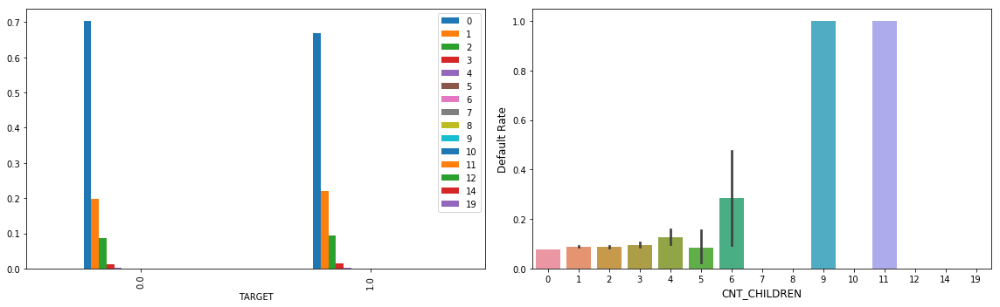

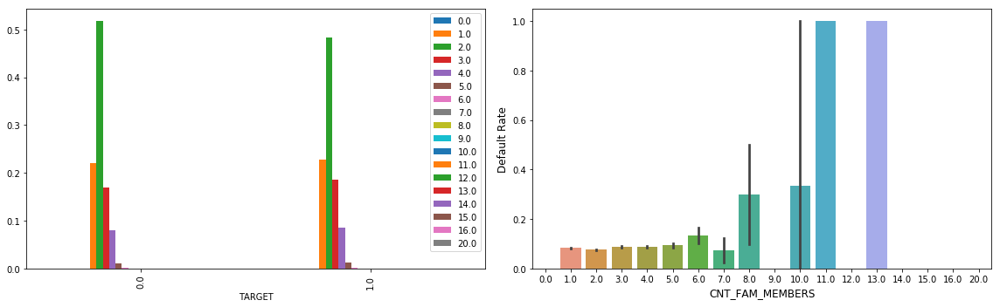

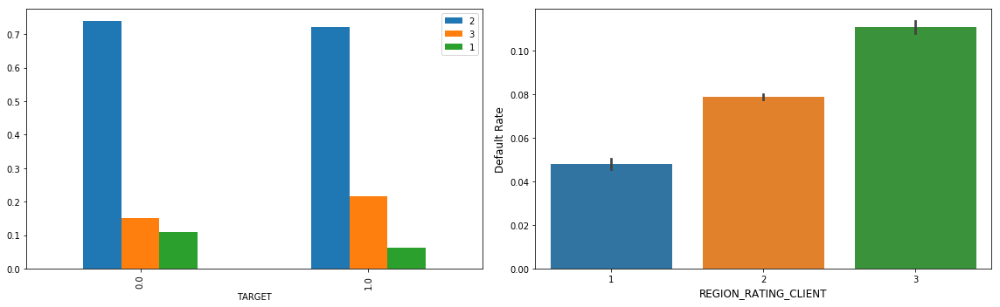

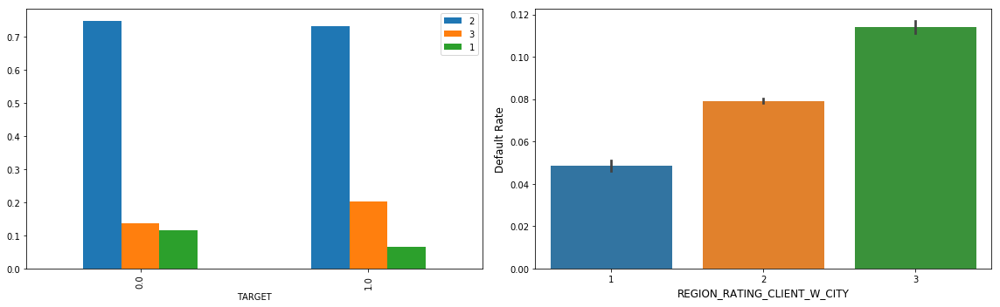

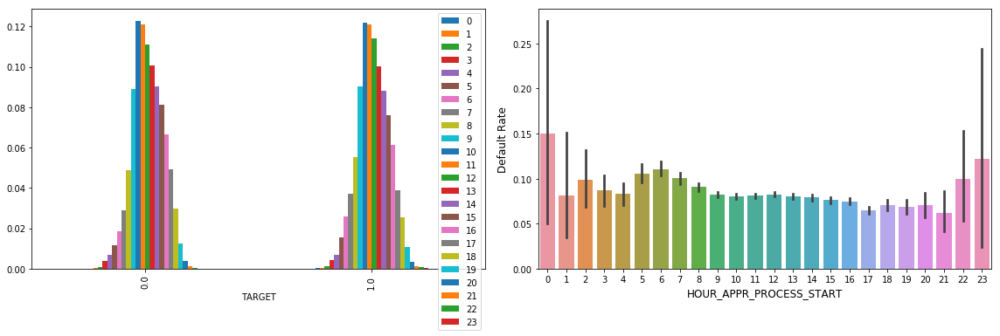

...

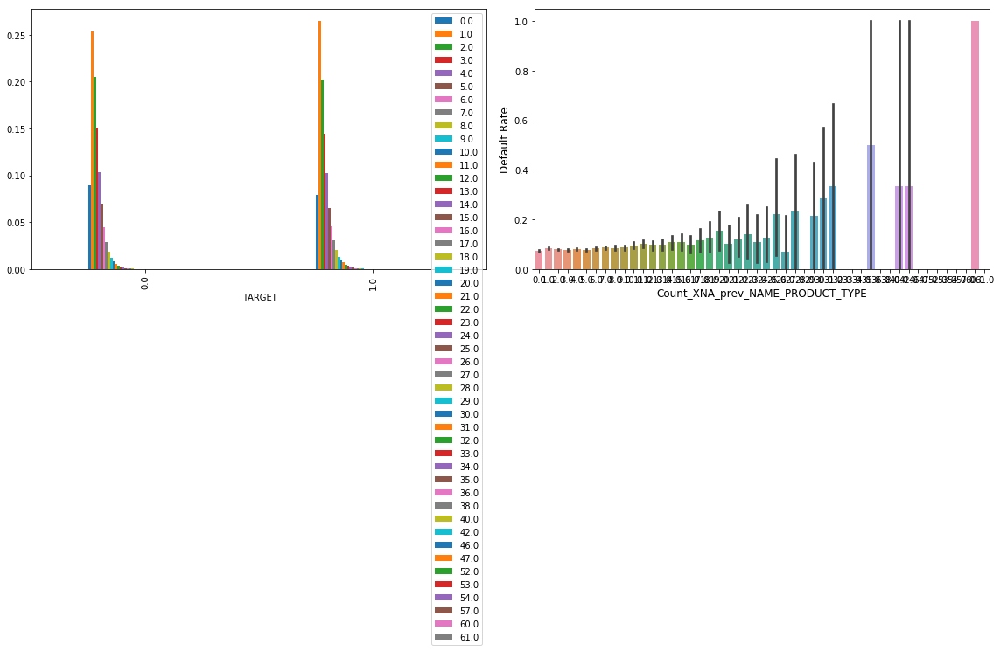

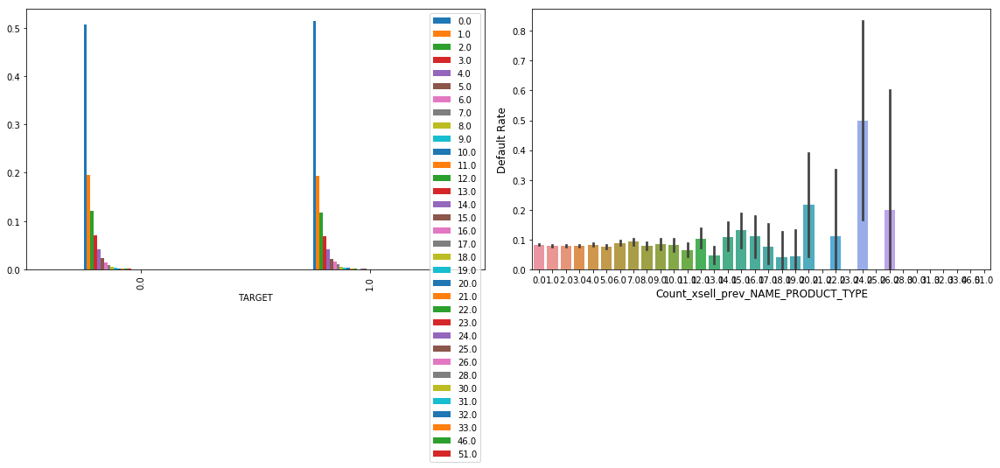

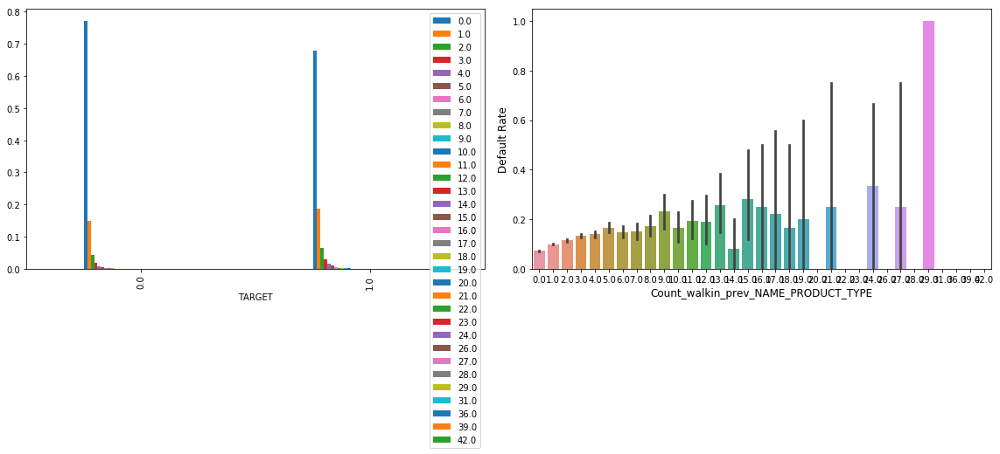

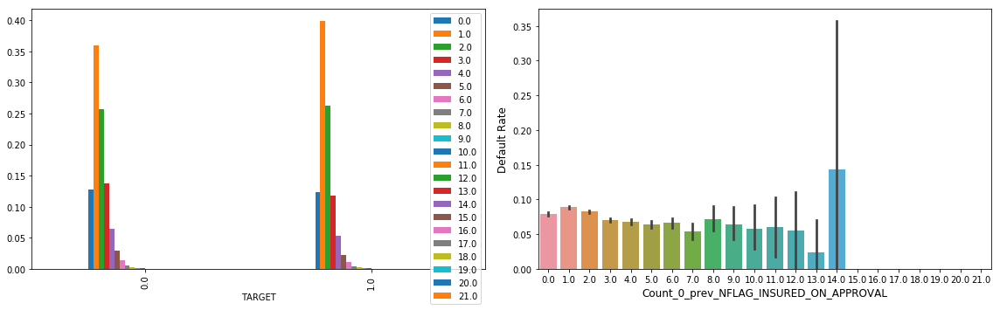

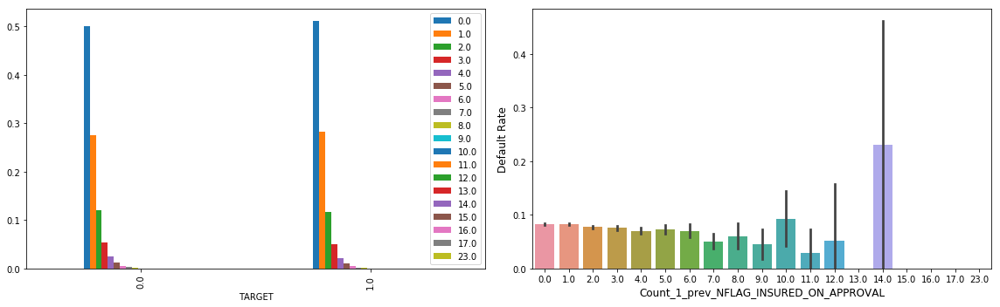

In [16]:
# visualize the categorical features
for feature in dis_feature:
    fig, ax = plot_categorical(train, feature=feature, figsize=(16, 5))
    plt.show()

# Continuous Features

In [17]:
# get missing information (missing rate > 0)
train_null = train[con_feature].isnull().sum() / len(train)
train_null = train_null[train_null > 0]
train_null = train_null.reset_index()
train_null = train_null.rename(columns={'index': 'feature', 0: 'train miss'})

test_null = test[con_feature].isnull().sum() / len(test)
test_null = test_null[test_null > 0]
test_null = test_null.reset_index()
test_null = test_null.rename(columns={'index': 'feature', 0: 'test miss'})

# merge train and test null information
data_null = pd.merge(left=train_null, right=test_null, how='outer')
data_null = data_null.fillna(value=0)
data_null = data_null.sort_values(by='train miss', ascending=False)

feature_list = data_null['feature']
null_rate = []
not_null_rate = []
category = []
train_unique = []
test_unique = []
for feature in feature_list:
    null_rate.append(train[train[feature].isnull()]['TARGET'].mean())
    not_null_rate.append(train[~train[feature].isnull()]['TARGET'].mean())
    category.append(train[feature].dtype)
    train_unique.append(len(train[feature].unique()))
    test_unique.append(len(test[feature].unique()))

data_null['dtype'] = category    
data_null['null mean'] = null_rate
data_null['not null mean'] = not_null_rate
data_null['train unique'] = train_unique
data_null['test unique'] = test_unique

data_null = data_null.reset_index(drop=True)

data_null[['feature', 'train miss', 'test miss', 'dtype', 'null mean', 
           'not null mean', 'train unique', 'test unique']]

,feature,train miss,test miss,dtype,null mean,not null mean,train unique,test unique
0,EXT_SOURCE_3,0.198256,0.177827,float64,0.093119,0.077666,815,703
1,Median_CASH_CNT_INSTALMENT,0.058831,0.019284,float64,0.066829,0.081599,107,91
2,Median_CASH_CNT_INSTALMENT_FUTURE,0.058831,0.019284,float64,0.066829,0.081599,122,120
3,Mean_CASH_CNT_INSTALMENT,0.058831,0.019284,float64,0.066829,0.081599,41222,14598
4,Mean_CASH_CNT_INSTALMENT_FUTURE,0.058831,0.019284,float64,0.066829,0.081599,39840,14148
5,Sum_CASH_CNT_INSTALMENT_FUTURE,0.058753,0.019202,float64,0.066641,0.081609,2893,2157
6,Sum_CASH_SK_DPD_DEF,0.058753,0.019202,float64,0.066641,0.081609,374,141
7,Median_CASH_SK_DPD,0.058753,0.019202,float64,0.066641,0.081609,1120,210
8,Mean_CASH_SK_DPD,0.058753,0.019202,float64,0.066641,0.081609,10769,3071
9,Sum_CASH_SK_DPD,0.058753,0.019202,float64,0.066641,0.081609,3709,772


In [18]:
# feature engineering
con_missing = ['EXT_SOURCE_3', 'Median_CASH_CNT_INSTALMENT',
       'Median_CASH_CNT_INSTALMENT_FUTURE', 'Mean_CASH_CNT_INSTALMENT',
       'Mean_CASH_CNT_INSTALMENT_FUTURE', 'Sum_CASH_CNT_INSTALMENT_FUTURE', 
       'Sum_CASH_SK_DPD_DEF', 'Median_CASH_SK_DPD', 'Mean_CASH_SK_DPD', 
       'Sum_CASH_SK_DPD', 'Active_CASH_CONTRACT', 'Median_CASH_SK_DPD_DEF',
       'Sum_CASH_CNT_INSTALMENT', 'Median_CASH_MONTH_BALANCE',
       'Mean_CASH_MONTH_BALANCE', 'Sum_CASH_MONTH_BALANCE',
       'Mean_CASH_SK_DPD_DEF', 'Median_prev_AMT_GOODS_PRICE',
       'Mean_prev_AMT_GOODS_PRICE', 'Median_prev_AMT_ANNUITY',
       'Mean_prev_AMT_ANNUITY', 'Median_prev_CNT_PAYMENT',
       'Mean_prev_CNT_PAYMENT', 'Mean_prev_AMT_CREDIT',
       'Sum_prev_AMT_ANNUITY', 'Sum_prev_AMT_APPLICATION',
       'Mean_prev_AMT_APPLICATION', 'Median_prev_AMT_APPLICATION',
       'Sum_prev_AMT_CREDIT', 'Mean_prev_DAYS_DECISION',
       'Median_prev_DAYS_DECISION', 'Median_prev_AMT_CREDIT',
       'Sum_prev_AMT_DOWN_PAYMENT', 'Sum_prev_AMT_GOODS_PRICE',
       'Sum_prev_CNT_PAYMENT', 'Sum_prev_RATE_DOWN_PAYMENT',
       'Sum_prev_DAYS_DECISION', 'Median_DAYS_ENTRY_PAYMENT',
       'Mean_AMT_PAYMENT', 'Median_AMT_PAYMENT', 'Mean_DAYS_ENTRY_PAYMENT', 
       'Median_DAYS_INSTALMENT', 'Sum_AMT_PAYMENT', 'Median_AMT_INSTALMENT',
       'Sum_NUM_INSTALMENT_VERSION', 'Mean_NUM_INSTALMENT_VERSION',
       'Median_NUM_INSTALMENT_VERSION', 'Sum_NUM_INSTALMENT_NUMBER',
       'Mean_NUM_INSTALMENT_NUMBER', 'Median_NUM_INSTALMENT_NUMBER',
       'Sum_DAYS_INSTALMENT', 'Mean_DAYS_INSTALMENT', 'Sum_DAYS_ENTRY_PAYMENT', 
       'Sum_AMT_INSTALMENT', 'Mean_AMT_INSTALMENT', 'EXT_SOURCE_2', 'AMT_GOODS_PRICE',
       'AMT_ANNUITY', 'DAYS_LAST_PHONE_CHANGE']

# fill missing vcat_missingth 'NA'
for feature in con_missing:
    median = train[feature].median()
    train[feature] = train[feature].fillna(value=median)
    test[feature] = test[feature].fillna(value=median)
    
# process outlier
train = train[train['AMT_INCOME_TOTAL'] != 117000000]
train.loc[train['DAYS_EMPLOYED'] == 365243, 'DAYS_EMPLOYED'] = 1
test.loc[test['DAYS_EMPLOYED'] == 365243, 'DAYS_EMPLOYED'] = 1
    
# double check the missing values
print(train[con_missing].isnull().sum().sum(), test[con_missing].isnull().sum().sum())

0 0


In [19]:
# helper function for visualization
def plot_numerical(data, feature, figsize=(16, 5)):
    data = data[~data[feature].isnull()]
    grouped = data[[feature, 'TARGET']].groupby(feature)
    mean = grouped.mean().reset_index()
    hist_kws={'histtype': 'bar', 'edgecolor':'black', 'alpha': 0.2}
    warnings.filterwarnings('ignore')

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=figsize)
    sns.distplot(data[data['TARGET'] == 0][feature], label='TARGET=0', 
                 ax=ax[0], hist_kws=hist_kws)
    sns.distplot(data[data['TARGET'] == 1][feature], label='TARGET=1', 
                 ax=ax[0], hist_kws=hist_kws)
    ax[0].legend()
    ax[1].plot(mean[feature], mean['TARGET'], '.:', alpha=0.5)
    ax[1].set_xlabel(feature)
    ax[1].set_ylabel('Mean')
    ax[1].grid(True)
    plt.tight_layout()
    return fig, ax

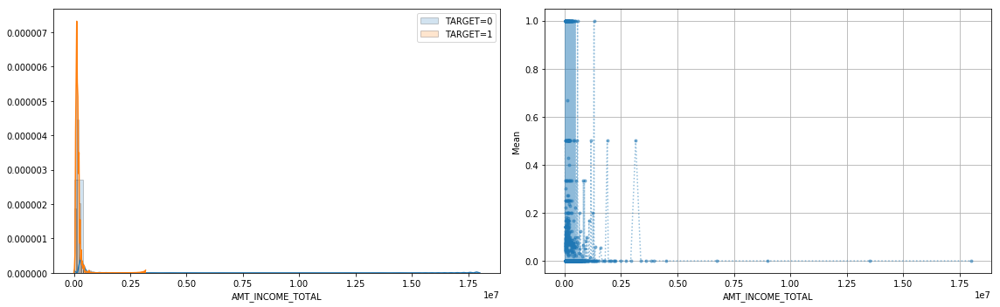

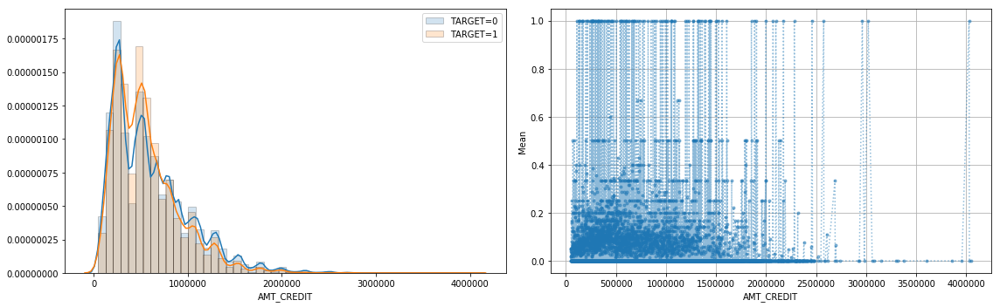

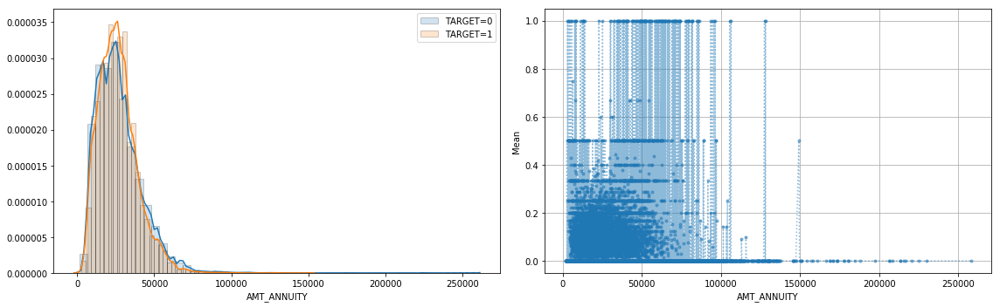

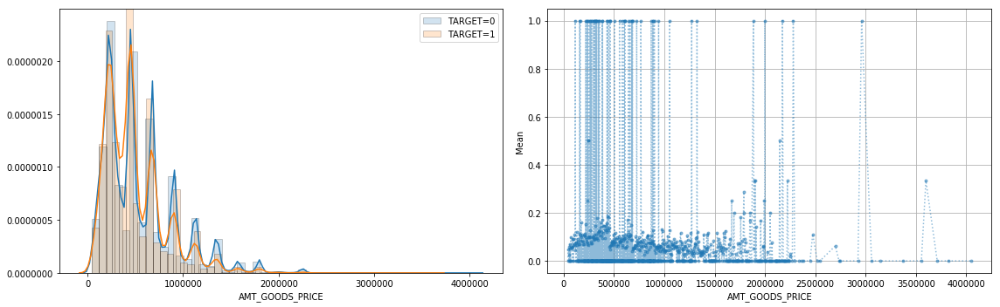

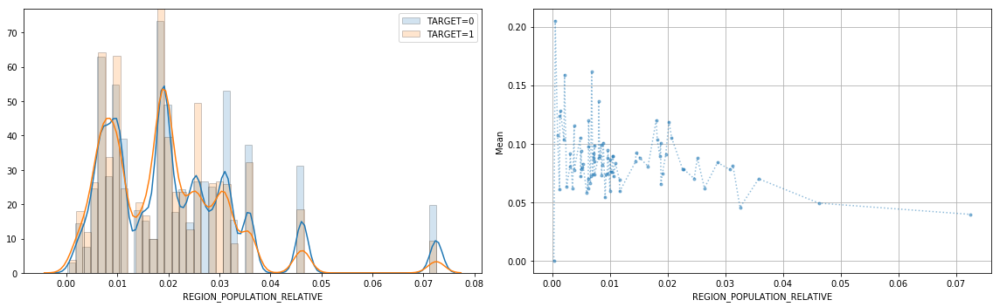

...

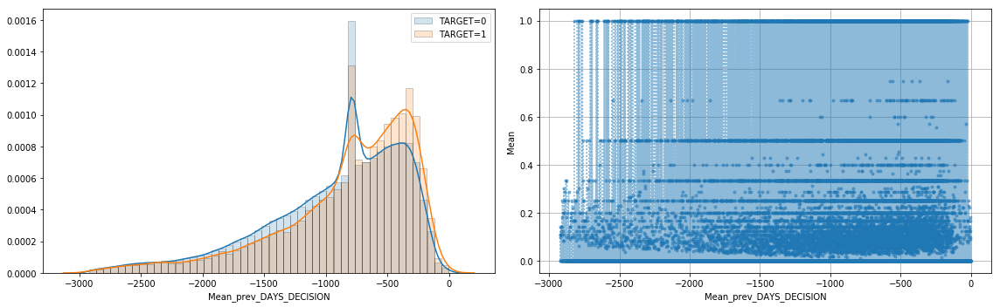

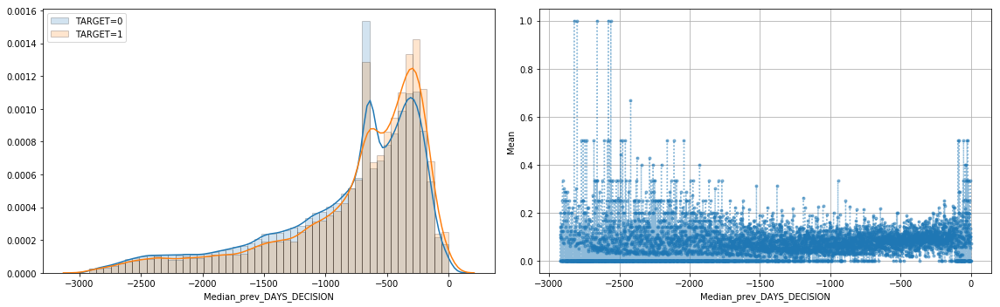

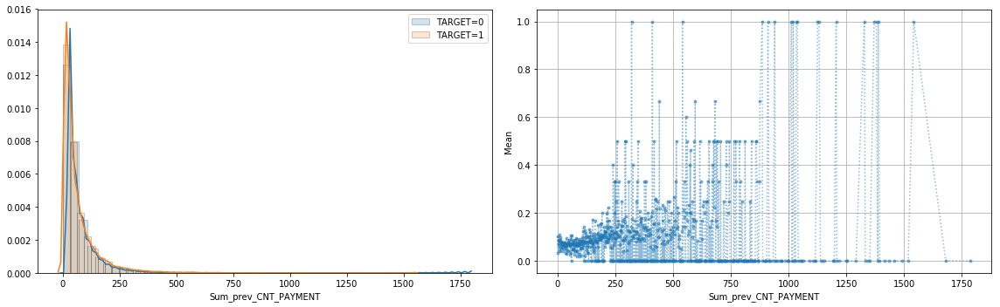

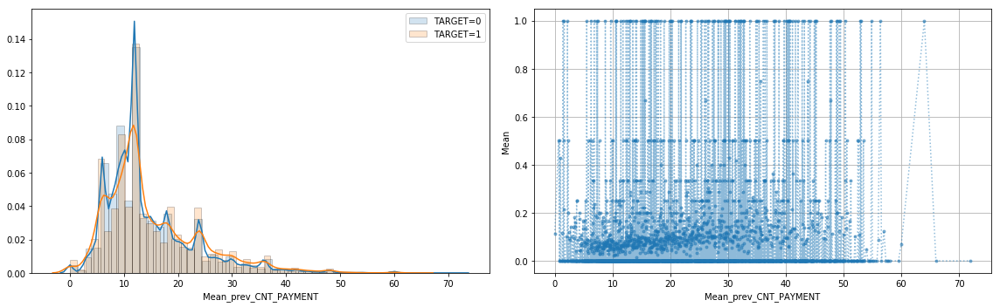

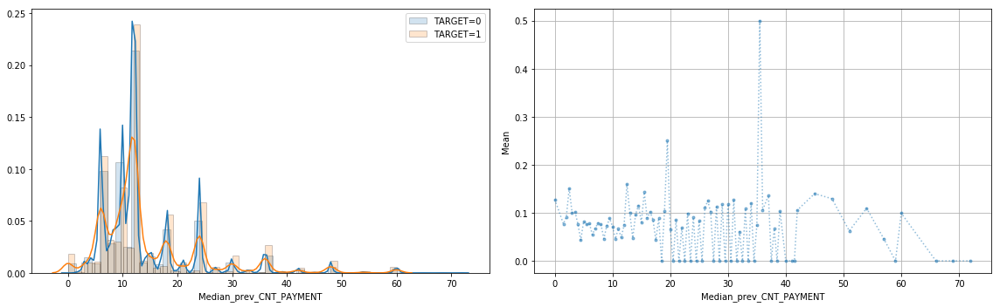

In [20]:
# visualize the categorical features
for feature in con_feature:
    fig, ax = plot_numerical(train, feature=feature, figsize=(16, 5))
    plt.show()

# Correlation Heatmap

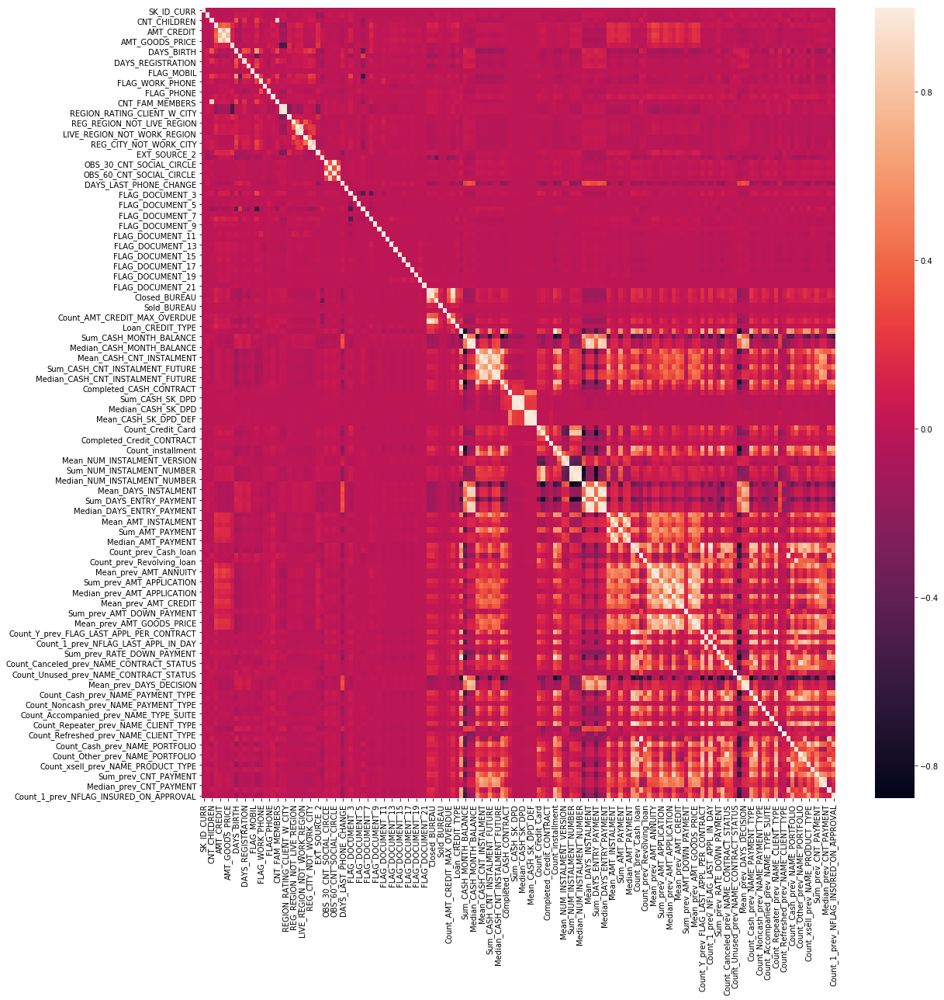

In [21]:
corr = train.corr()

fig, ax = plt.subplots(figsize=(18, 18))
sns.heatmap(corr)
plt.tight_layout()
plt.show()